 # Lending Club Case Study

## Problem Statement

Lending Club faces a critical challenge in minimizing credit losses stemming from loans to "risky" applicants. The objective is twofold: identifying applicants likely to repay for profitability while avoiding substantial financial losses associated with approving loans for those at risk of default. The primary focus is on making sound decisions in the loan approval process to strike a balance between generating profits through interest payments and preventing potential business loss by rejecting creditworthy applicants. The overall goal is to assist Lending Club in effectively navigating the delicate equilibrium between financial gain and risk mitigation.

## Introduction

### -  Objective

The objective of employing Exploratory Data Analysis (EDA) on Lending Club data is to uncover meaningful insights and patterns within the loan approval process. EDA aims to identify key factors influencing credit losses, enabling informed decision-making to mitigate risks, optimize profitability, and enhance the overall efficiency of lending operations.

# 1. Data Understanding

#### Primary column
- **Loan Status:** The Principal Attribute of Interest (*loan_status*). This column consists of three distinct values:
    - Fully-Paid: Signifies customers who have successfully repaid their loans.
    - Charged-Off: Indicates customers who have been labeled as "Charged-Off" or have defaulted on their loans.
    - Current: Represents customers whose loans are presently in progress.
#### Other signicant columns

* **Customer Details**
    * **Annual Income (annual_inc):** Annual income of the customer
    * **Home Ownership (home_ownership):** Has Own house or not
    * **Employment Length (emp_length):** Employment length of the customer
    * **Debt to Income (dti):** metric measuring one's debt relative to income.
    * **State (addr_state):** Location of the customer
    
    
* **Loan related important columns**
    * **Loan Amount (loan_amt):** Amount of Money requested by Barrower
    * **Grade (grade):** Based on the Loan Type and credit assement,LC assinged grade
    * **Term (term):**  Duration of the loan in months 
    * **Loan Date (issue_d):**  Date of Loand issued
    * **Purpose of Loan (purpose):**  purpose of loan such as debt consolidation,home ,medical or etc.
    * **Verification Status (verification_status):** borrower's data verfied or not like income and other  property the barrower hold 
    * **Interest Rate (int_rate):** Loan interest rate
    * **Installment (installment):** number of months to repay
    * **Public Records Bankruptcy (public_rec_bankruptcy):** number of locally available bankruptcy records for the customer.
    * **Funded Amount (funded_amnt):** The total amount committed By LC to the Barrower .
    * **Past Due Records (delinq_2yrs):** The number of times the borrower had been 30+ days past due on a payment in the past 2 years..
       
* **Excluded columns**
    * **Null Columns:** All the columns with NA or blank.
    * **Only one:** column has only one value for all its rows.
    * **Non significant columns:** Columns which null more than 90% , we cannot use for our analysis.And also the columns which has more text and customner comment columns which may help much.
    * **Non relevant columns:** Columns which derving the status of loan as Charged off 

# 2. Data Loading


#### importing Libraries for data manipulation

In [1]:
import pandas as pd #dataframe
import numpy as np #numerical python

#### importing Libraries for data visualization


In [2]:
import seaborn as sns #data visualization
import matplotlib.pyplot as plt #plotting
import plotly.express as px #plotting

#### Warnings library will be used to ignore some warnings

In [3]:
import warnings #warning
warnings.filterwarnings('ignore')


##### Common funtion

In [4]:
def plot_boxplot(df: pd.DataFrame, column_name: str,  labels: str = None) -> None:
    px.box(df,x=column_name,width=1000,height=350,title='Distribution of '+ labels,labels={column_name:labels}).show()


In [5]:
def plot_line(df: pd.DataFrame, column_name: str,  index: str = None) -> None:
    px.line(df,width=1000,height=350,title='Trend of '+ column_name,labels={'value':column_name,'index':index}).show()

In [6]:
def make_bucket(df: pd.DataFrame, bins: list = None,  labels: list = None) -> pd.DataFrame:
    df_Result = pd.cut(df, bins=bins, labels=labels, right=False)
    return df_Result

In [7]:
def plot_bar_graph(dataframe, x_column, y_column=None, hue_column=None, title=None, xlabel=None, ylabel=None, figsize=(10, 6), x_tick_rotation=90, freq_rotation=0):
    # Set the style
    sns.set(style="whitegrid")

    # Create the bar plot
    plt.figure(figsize=figsize)
    
    if y_column:
        y_data = dataframe[y_column].value_counts()
        x_data = y_data.index
        sns.barplot(x=x_data, y=y_data.values, hue=hue_column)
    else:
        sns.barplot(data=dataframe, x=x_column, hue=hue_column)

    # Display frequency on top of the bars with rotation
    if y_column:
        for p in plt.gca().patches:
            plt.gca().annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom', rotation=freq_rotation)

    # Set title and labels
    if title:
        plt.title(title, fontsize=14)
    if xlabel:
        plt.xlabel('', fontsize=12)
    if ylabel:
        plt.ylabel(ylabel, fontsize=12)

    # Rotate x-axis labels
    plt.xticks(rotation=x_tick_rotation)

    # Show the plot
    plt.show()


In [8]:
def plot_Quantitativechart(df, column,title,bins=10, figsize=(8, 6)):
    # Histogram
    plt.figure(figsize=(12, 6))
    plt.subplot(2, 3, 1)
    sns.histplot(data=df, x=column, bins=30, kde=True)
    plt.xlabel('', fontsize=12)
    plt.title('Histogram for '+ title)

    # Box Plot
    plt.subplot(2, 3, 2)
    sns.boxplot(data=df, y=column)
    plt.xlabel('', fontsize=12)
    plt.title('Box Plot for '+ title)
    

    # Violin Plot
    plt.subplot(2, 3, 3)
    sns.violinplot(data=df, y=column)
    plt.xlabel('' ,fontsize=12)
    plt.title('Violin Plot for '+ title )

  

    plt.tight_layout()
    plt.show()

In [9]:
def plot_SegmentedUnivariateforLoanStatus(df, column, columnlabel,segmentcol,segmentedlabel ):

        plt.gcf().set_size_inches(11.7, 8.27)
        ax=sns.countplot(x=column, hue=segmentcol, data=df)
        plt.title('Segmented Univariate Analysis: '+ columnlabel + ' segmented by '+ segmentedlabel)
        plt.xlabel(columnlabel)
        plt.ylabel('Count')
        
        ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right");
        all_heights = [[p.get_height() for p in bars] for bars in ax.containers]
        for bars in ax.containers:
            for i, p in enumerate(bars):
                total = sum(xgroup[i] for xgroup in all_heights)
                percentage = f'{(100 * p.get_height() / total) :.1f}%'
                ax.annotate(percentage, (p.get_x() + p.get_width() / 2, p.get_height()), size=11, ha='center', va='bottom')

        plt.show()

   

#### Loading data from loan CSV and Data Dictonary

In [10]:
lending_df = pd.read_csv('loan.csv')
Lending_dd = pd.read_excel('Data_Dictionary.xlsx')

#### Basic information about the data

In [11]:
print('Shape:',lending_df.shape)
print('Missing values:',lending_df.isnull().sum().sum())
print('Unique values:',lending_df.nunique().sum())
print('Duplicates:',lending_df.duplicated().sum())

Shape: (39717, 111)
Missing values: 2263366
Unique values: 416800
Duplicates: 0


# 3. Data Cleaning and Manipulation

#### Dropping columns where missing data is  equal to 100%


In [12]:
lending_df.loc[:,lending_df.isnull().sum()/lending_df.shape[0]*100==100] .columns

Index(['mths_since_last_major_derog', 'annual_inc_joint', 'dti_joint',
       'verification_status_joint', 'tot_coll_amt', 'tot_cur_bal',
       'open_acc_6m', 'open_il_6m', 'open_il_12m', 'open_il_24m',
       'mths_since_rcnt_il', 'total_bal_il', 'il_util', 'open_rv_12m',
       'open_rv_24m', 'max_bal_bc', 'all_util', 'total_rev_hi_lim', 'inq_fi',
       'total_cu_tl', 'inq_last_12m', 'acc_open_past_24mths', 'avg_cur_bal',
       'bc_open_to_buy', 'bc_util', 'mo_sin_old_il_acct',
       'mo_sin_old_rev_tl_op', 'mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl',
       'mort_acc', 'mths_since_recent_bc', 'mths_since_recent_bc_dlq',
       'mths_since_recent_inq', 'mths_since_recent_revol_delinq',
       'num_accts_ever_120_pd', 'num_actv_bc_tl', 'num_actv_rev_tl',
       'num_bc_sats', 'num_bc_tl', 'num_il_tl', 'num_op_rev_tl',
       'num_rev_accts', 'num_rev_tl_bal_gt_0', 'num_sats', 'num_tl_120dpd_2m',
       'num_tl_30dpd', 'num_tl_90g_dpd_24m', 'num_tl_op_past_12m',
       'pct_tl_nvr_dl

In [13]:
lending_df = lending_df.loc[:,lending_df.isnull().sum()/lending_df.shape[0]*100<100]        
lending_df.shape


(39717, 57)

In [14]:
# Finding columns which contain 1  value on all rows
print(lending_df.loc[:,lending_df.nunique()>1].columns)

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'url', 'desc', 'purpose', 'title', 'zip_code',
       'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'mths_since_last_delinq', 'mths_since_last_record',
       'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc',
       'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv',
       'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'next_pymnt_d', 'last_credit_pull_d', 'pub_rec_bankruptcies'],
      dtype='object')


In [15]:
# Removing irrelevant columns which contain 1  value on all rows
lending_df = lending_df.loc[:,lending_df.nunique()>1]
# Shape of the dataframe after removing columns
print(lending_df.shape)

(39717, 48)


In [16]:
lending_df.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'url', 'desc', 'purpose', 'title', 'zip_code',
       'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'mths_since_last_delinq', 'mths_since_last_record',
       'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc',
       'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv',
       'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'next_pymnt_d', 'last_credit_pull_d', 'pub_rec_bankruptcies'],
      dtype='object')

In [17]:
# Removing unwanted columns which are  used for not significant for loan approval
lending_df=lending_df.drop(['delinq_2yrs','pub_rec','title','total_acc','open_acc','out_prncp','total_rec_prncp','collection_recovery_fee','next_pymnt_d','mths_since_last_delinq','out_prncp_inv','total_rec_int','last_pymnt_d','last_credit_pull_d','url','mths_since_last_record','revol_bal','total_pymnt','total_rec_late_fee','last_pymnt_amnt','earliest_cr_line','revol_util','total_pymnt_inv','recoveries'],axis=1)
# Removing Desc,emp_title,they are too many and it will take too long to understand the pattern
lending_df=lending_df.drop(['desc' ],axis=1)
# Removing id as it is a duplicate index column
lending_df=lending_df.drop(['id'],axis=1)
# Removing ZIP as it has masked data
lending_df=lending_df.drop(['zip_code'],axis=1)
# Shape of the dataframe after removing columns
print(lending_df.shape)

(39717, 21)


#### Data Conversion

In [18]:
# Convert int_rate column to float type
lending_df['int_rate'] = lending_df['int_rate'].apply(lambda x: float(x.replace('%', '').strip()))

In [19]:
# Converting all amount and Ratio to float
lending_df = lending_df.astype({
    'dti': 'float',
    'funded_amnt' : 'float',
    'funded_amnt_inv' : 'float',
    'loan_amnt' : 'float'
    ,'int_rate' : 'float'
})

In [20]:
selected_columns = ['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'int_rate', 'dti']
lending_df[selected_columns] = lending_df[selected_columns].apply(lambda col: col.round(2))


In [21]:
# Convert term column to int type
lending_df['term'] = lending_df['term'].apply(lambda x: int(x.replace('months', '').strip()))


In [22]:
# Correcting data type and format for columns in the dataframe
## Derving more columns with the conversion of data type
lending_df.grade=lending_df.grade.astype('category')
lending_df.sub_grade=lending_df.sub_grade.astype('category')
lending_df.home_ownership=lending_df.home_ownership.astype('category')
lending_df.verification_status=lending_df.verification_status.astype('category')
lending_df.issue_d=pd.to_datetime(lending_df.issue_d,format='%b-%y')
lending_df['issue_year']=pd.to_datetime(lending_df.issue_d,format='%b-%y').dt.year
lending_df['issue_month']=pd.to_datetime(lending_df.issue_d,format='%b-%y').dt.month
lending_df['issue_quater'] = lending_df['issue_d'].dt.quarter.apply(lambda x: 'Q'+str(x))
 
lending_df.purpose=lending_df.purpose.astype('category')
lending_df.addr_state=lending_df.addr_state.astype('category')
lending_df.emp_length=lending_df.emp_length.apply(lambda x: str(x).replace('years','').replace('+','').replace('< 1','0.5').replace('year','')).astype(float)
lending_df.loan_status=lending_df.loan_status.astype('category')

In [23]:
## Derving more columns with the conversion
loan_status_Default = {'Charged Off': 'Yes', 'Fully Paid': 'No' ,'Current' : 'No'}
lending_df['loan_Default'] = lending_df['loan_status'].map(loan_status_Default)

#### Outliner

In [24]:
# Visualising the outliner of Loan amount (Quantitative)
plot_boxplot(lending_df,'loan_amnt','Loan Amount')
## Upper fence and Max values do not have significant difference-(Upper fence-29.175k ,Max=35 K)

In [25]:
# Visualising the outliner of Interest Rate (Quantitative)
plot_boxplot(lending_df,'int_rate','Interest Rate')
## Upper fence and Max values do not have significant difference-(Upper fence-22.48 ,Max=24.59)

In [26]:
# Visualising the outliner of Annual Income (Quantitative)
plot_boxplot(lending_df,'annual_inc','Annual Income')
# Upper fence and Max values have significant difference-(Upper fence-22.48 ,Max=24.59)
# thus we will remove the outliers in column annual_inc.
## Removing outliers in annual_inc greater than 99th percentile
lending_df = lending_df[lending_df.annual_inc<=np.percentile(lending_df.annual_inc,99)]
# Visualising the outliner of Annual Income (Quantitative)
plot_boxplot(lending_df,'annual_inc','Annual Income after Removing outliers')

In [27]:
## checking Annual Income using line chart to find the further outliers using Trend
plot_line(sorted(lending_df.annual_inc),'Annual Income','Position in Data')


In [28]:
#Annual income looks more clean and can be considered for the Analysis

In [29]:
# Visualising the outliner of Funded amount (Quantitative)
fundedamountlist=[['funded_amnt','Funded Amount'],['funded_amnt_inv','Disbursed Amount']]
for var in fundedamountlist:
    plot_boxplot(lending_df,var[0],var[1])
#There are no outliner for Funded Amount

In [30]:
## checking Funded amount using line chart to find the further outliers using Trend
# Visualising the outliner of Funded amount and   disbursed fund amount (Quantitative)
fundedamountlist=[['funded_amnt','Funded Amount'],['funded_amnt_inv','Disbursed Amount']]
for var in fundedamountlist:
    plot_line(sorted(lending_df[var[0]]),var[1],'Position in Data')
#There are no  Significant outliner for Funded Amount and   disbursed fund amount



In [31]:
#Annual income looks more clean and can be considered for the Analysis

In [32]:
# Visualising the outliner of DTI (Quantitative)
plot_boxplot(lending_df,'dti','DTI ratio')
#There are no outliner for DTI

#### Imputing values in Columns

In [33]:
#there are missing entries for the emp_length
lending_df.emp_length.isna().sum()
#We can consider them unknown category

1070

Employment length has 1070 missing values, Impute missing values with 11 will Help to understand  and it will be Easy to visualize those missing Records.Keep Number because we are using this variable as Ordered Category

In [34]:
lending_df.emp_length.fillna("11", inplace = True)

In [35]:
# Verify if the imputation of values is successful
lending_df.emp_length.isna().sum()

0

In [36]:
lending_df.home_ownership.value_counts()

home_ownership
RENT        18813
MORTGAGE    17378
OWN          3029
OTHER          96
NONE            3
Name: count, dtype: int64

Imputing NONE values as OTHER for home_ownership

In [37]:
lending_df['home_ownership'].replace('NONE', 'OTHER', inplace = True)

In [38]:
lending_df.home_ownership.value_counts()

home_ownership
RENT        18813
MORTGAGE    17378
OWN          3029
OTHER          99
Name: count, dtype: int64

In [39]:
lending_df.verification_status.value_counts()

verification_status
Not Verified       16831
Verified           12625
Source Verified     9863
Name: count, dtype: int64

Replacing the 'Source Verified' values as 'Verified' since both values mean the same thing i.e. the loan applicant has some source of income which is verified

In [40]:
lending_df['verification_status'].replace('Source Verified', 'Verified', inplace = True)

In [41]:
lending_df.pub_rec_bankruptcies.isna().sum()

688

There are 688 null values. if there is null then mostly no records, Zero is safe to impute

In [42]:
lending_df.pub_rec_bankruptcies.fillna(0, inplace = True)

In [43]:
# Verify if the dataset has no longer null values
lending_df.isna().sum()


member_id                  0
loan_amnt                  0
funded_amnt                0
funded_amnt_inv            0
term                       0
int_rate                   0
installment                0
grade                      0
sub_grade                  0
emp_title               2417
emp_length                 0
home_ownership             0
annual_inc                 0
verification_status        0
issue_d                    0
loan_status                0
purpose                    0
addr_state                 0
dti                        0
inq_last_6mths             0
pub_rec_bankruptcies       0
issue_year                 0
issue_month                0
issue_quater               0
loan_Default               0
dtype: int64

Creating different buckets for loan amount (loan_amount_bucket), interest rate (interest_rate_bucket), annual income (annual_income_bucket), Funded Amount (funded_amnt_bucket) ,   Disbursed Amount(funded_amnt_inv_bucket)

In [44]:
# Categorising Loan Amount
thresholds = [0,5000.0, 10000.0, 15000.0, np.inf]
labels = ['0 - 5K', '5K - 10K', '10K - 15K', '15K - above']
lending_df['loan_amnt_bucket']=make_bucket(lending_df['loan_amnt'],thresholds,labels)

In [45]:
# Categorising Funded Amount
thresholds = [0,5000.0, 10000.0, 15000.0, np.inf]
labels = ['0 - 5K', '5K - 10K', '10K - 15K', '15K - above']
lending_df['funded_amnt_bucket']=make_bucket(lending_df['funded_amnt'],thresholds,labels)

In [46]:
# Categorising Funded  Amount disbursed
thresholds = [0,5000.0, 10000.0, 15000.0, np.inf]
labels = ['0 - 5K', '5K - 10K', '10K - 15K', '15K - above']
lending_df['funded_amnt_inv_bucket']=make_bucket(lending_df['funded_amnt'],thresholds,labels)

In [47]:
# Bucketting for int_rate
thresholds = [0,5, 9, 13, 17, 21,np.inf]
labels = ['0%-5%', '5%-9%','9%-13%','13%-17%','17%-21%','21%-25%']
lending_df['int_rate_bucket']=make_bucket(lending_df['int_rate'],thresholds,labels)

In [48]:
# Categorising Annual Income
thresholds = [0,50000.0, 100000.0, 150000.0, np.inf]
labels = ['0 - 50K', '50K - 100K', '100K - 150K', '150K - above']
lending_df['annual_inc_bucket']=make_bucket(lending_df['annual_inc'],thresholds,labels)

In [49]:
# Bucketting DTI
thresholds = [0,8, 12, 16, 20, np.inf]
labels = ['Very Low', 'Low', 'Medium', 'High', 'Very High']
lending_df['dti_bucket']=make_bucket(lending_df['dti'],thresholds,labels)


In [50]:
# Bucketting installment
thresholds = [0,250, 500, 750, 1000,1250,np.inf]
labels = ['0-250', '250-500', '500-750', '750-1000','1000-1250','1250+']
lending_df['installment_bucket']=make_bucket(lending_df['installment'],thresholds,labels)
 

 # 3. Data Analysis

## 3.1.Univariate Analysis

Following columns will be checked as part of univariate analysis
1. Categorical variables
    1. Ordered categorical data
        1. Grade (grade)
        2. Sub grade (sub_grade)
        4. Employment length (emp_length)
        5. Issue year (issue_year)
        6. Issue month (issue_month)
        7. Issue quarter (issue_quater)

    2. Unordered categorical data
        1. Address State (addr_state)
        2. Loan purpose (purpose)
        3. Home Ownership (home_ownership)
        4. Loan status (loan_status)
        5. Number of public record bankruptcies(pub_rec_bankruptcies)
        
2. Quantitative variables
    1. Interest rate bucket (int_rate_bucket)
    2. Annual income bucket (annual_inc_bucket)
    3. Loan amount bucket (loan_amnt_bucket)
    4. Funded amount bucket (funded_amnt_bucket)
    5. Funded amount disbursed bucket (funded_amnt_inv_bucket)
    6. Debt to Income Ratio (DTI) bucket (dti_bucket)
    7. Monthly Installment (installment)
    8. Term (36 / 60 months) (term)

In [51]:
#Separating columns based on its nature
OrderedCat=['emp_length','grade', 'sub_grade',   'issue_year', 'issue_month', 'issue_quater']
nonOrderedCat= ['addr_state', 'purpose', 'home_ownership', 'loan_status', 'loan_Default','verification_status','pub_rec_bankruptcies']
Quantitative=['term','loan_amnt','int_rate','annual_inc','dti','pub_rec_bankruptcies','installment','inq_last_6mths','funded_amnt','funded_amnt_inv']


#### 3.1.1 Ordered categorical
OrderedCat=['emp_length','grade', 'sub_grade',  'issue_year', 'issue_month', 'issue_quater']


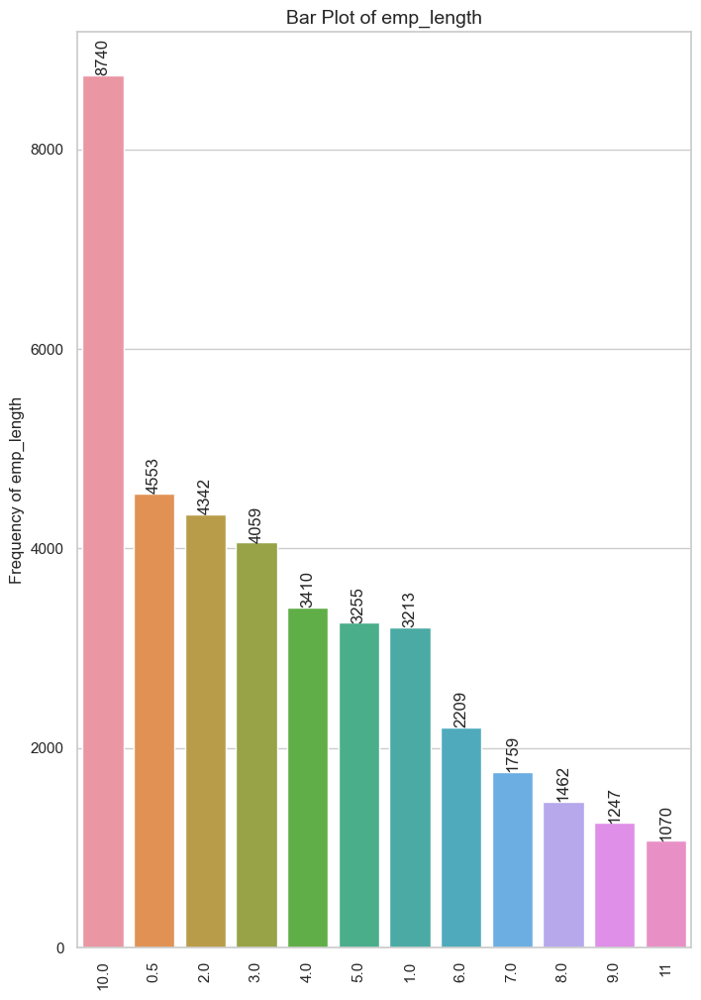

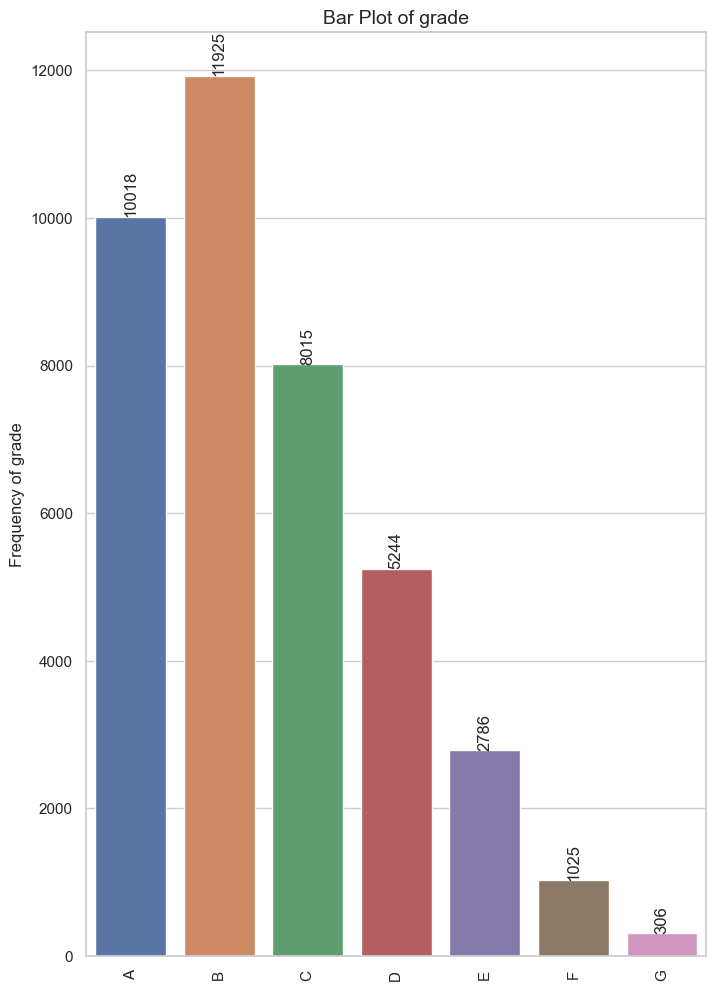

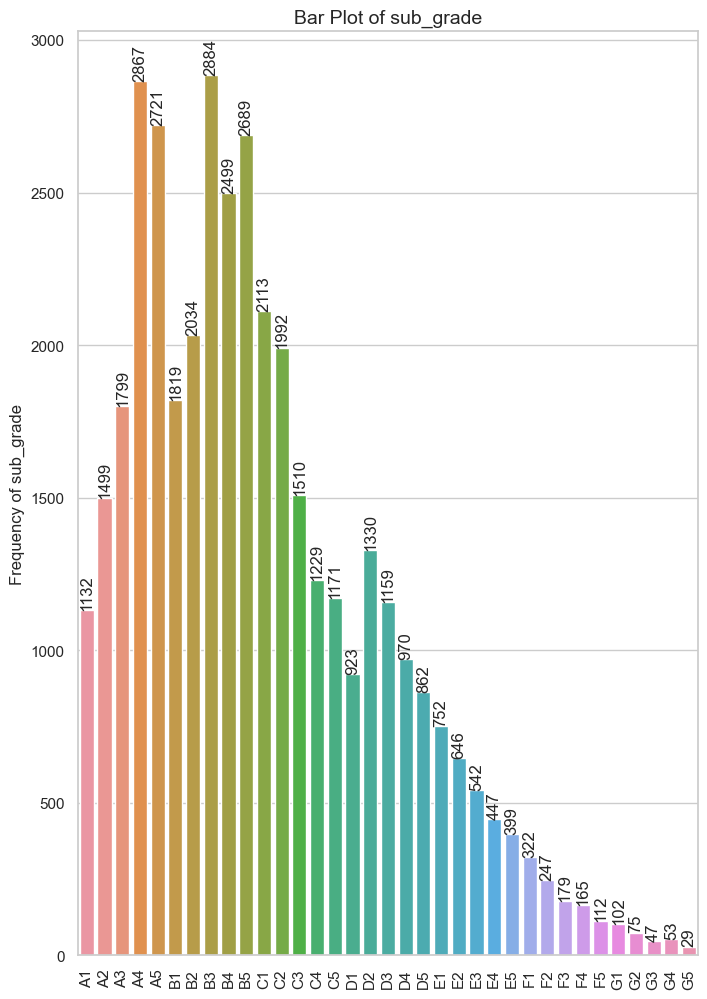

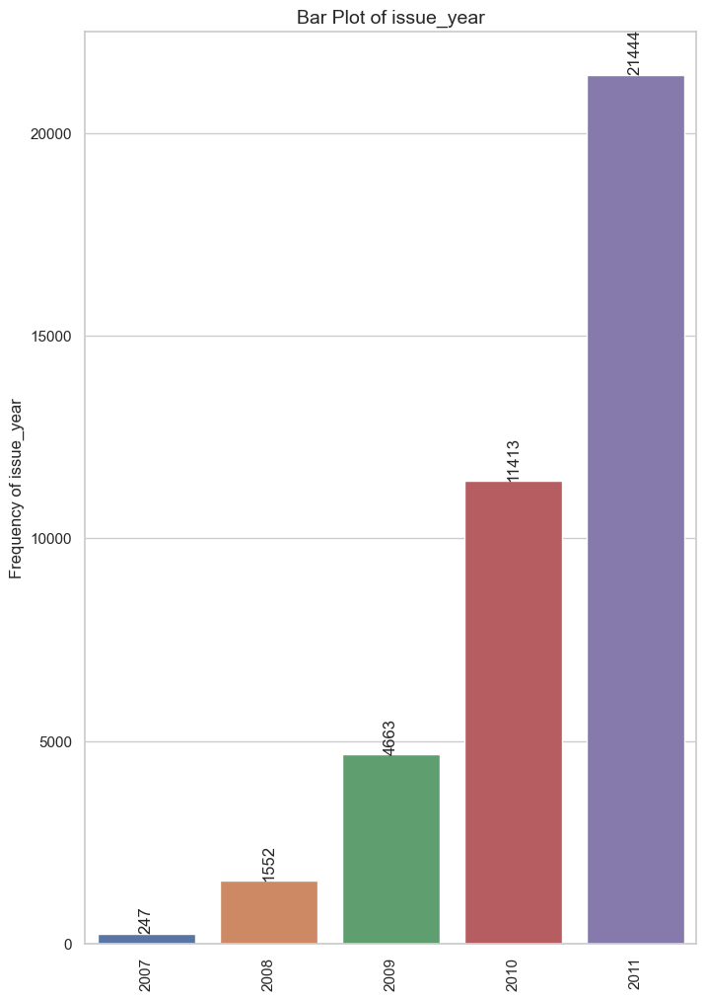

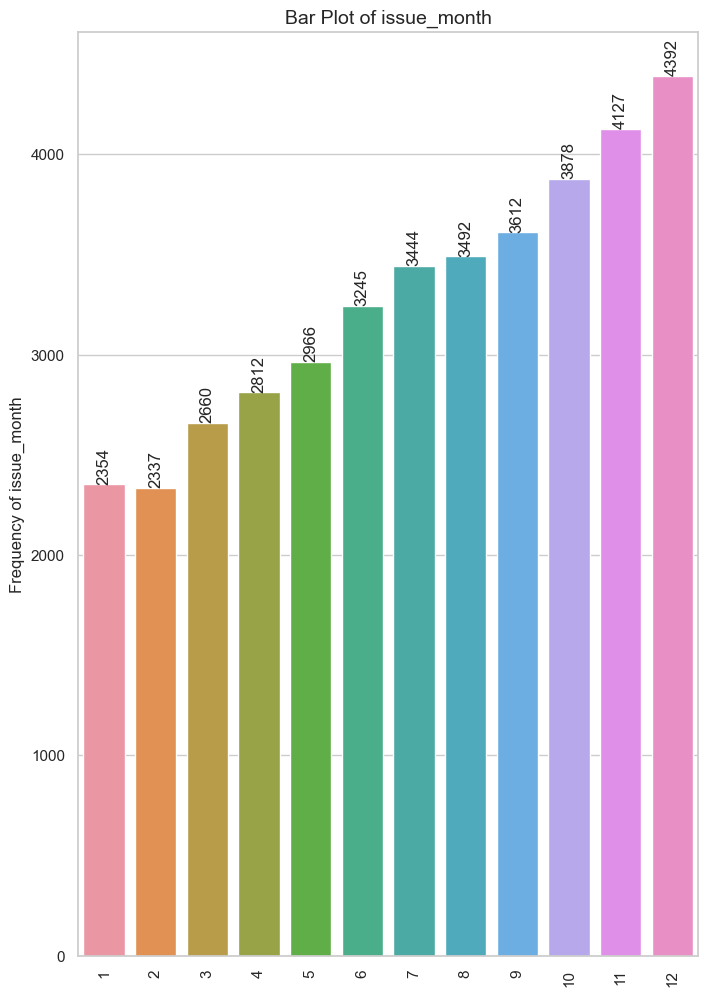

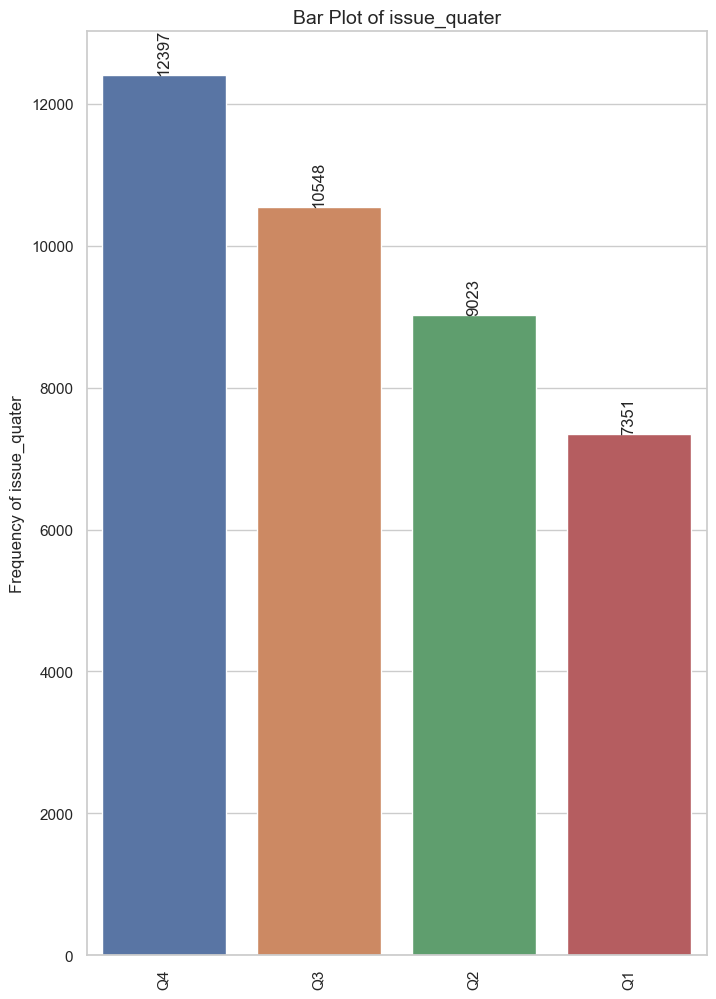

In [52]:
# visualize all Ordered categorical 
for cat_var in OrderedCat:
    plot_bar_graph(lending_df,   x_column = cat_var,
        y_column = cat_var,
        title = f'Bar Plot of {cat_var}',
        xlabel = cat_var,
        ylabel=f'Frequency of {cat_var}',
        figsize=(8, 12),
        x_tick_rotation=90,
        freq_rotation=90,)
    

#### Insights
#### Univariate Analysis  Ordered Category
- A large amount of loans are with grade 'A' and 'B' compared to rest.
- Majority of borrowers  have working experience greater than 10 years.  11  kept for Unkown Category.
- Majority of the loans are given in last quarter of the year.
- Majority of the loans are given in the Year 2011.
- Majority of the loans are given in  December.

#### 3.1.1 UnOrdered categorical


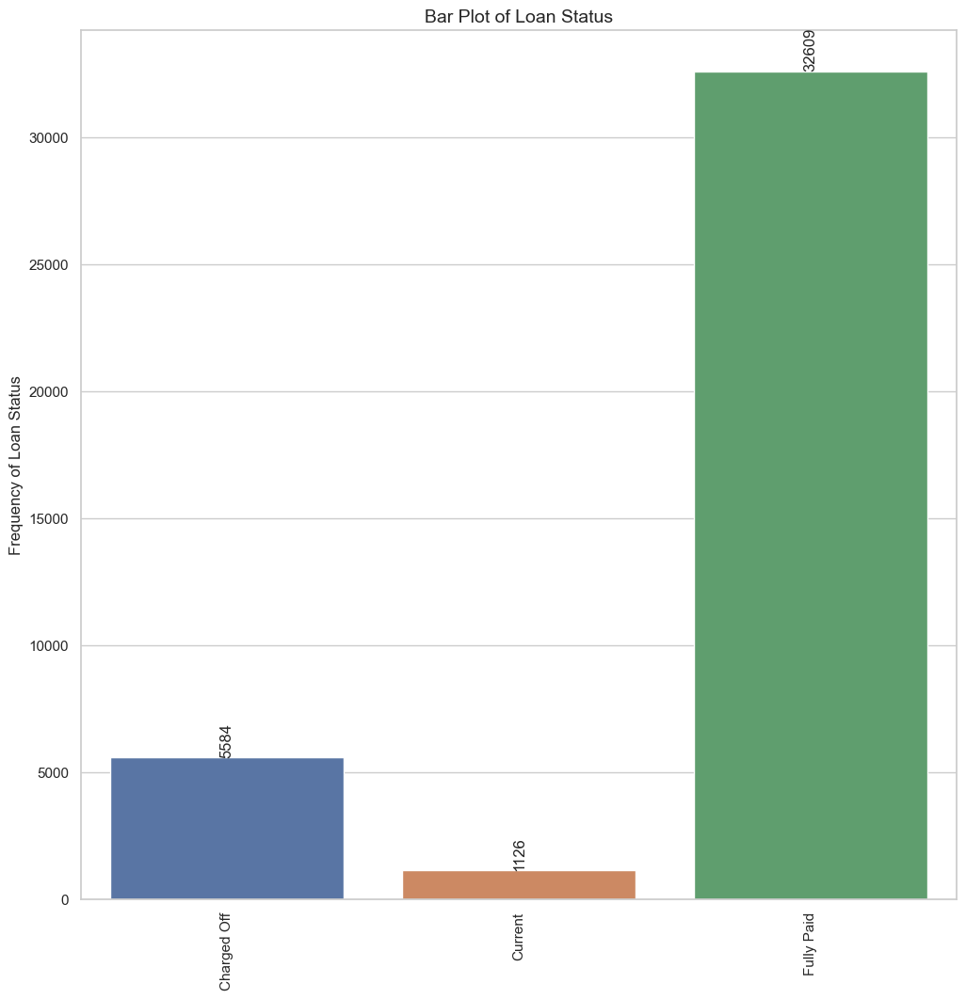

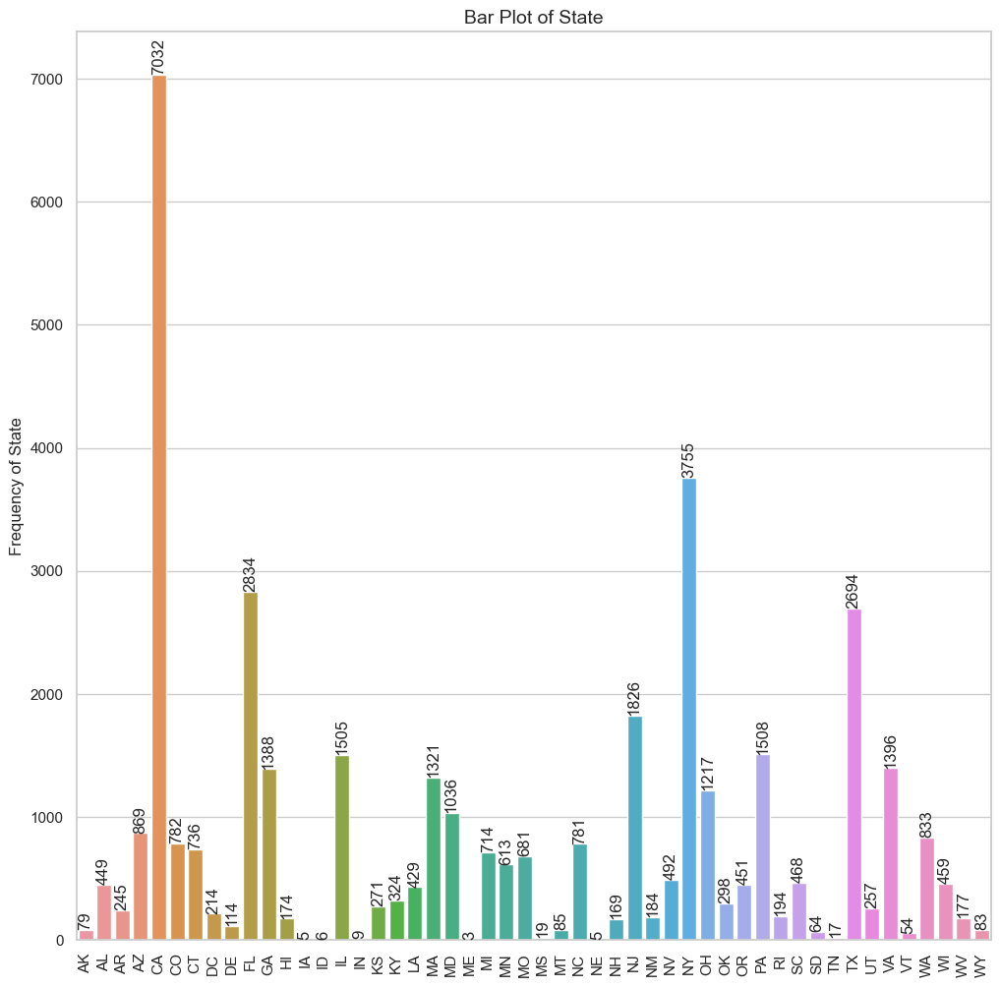

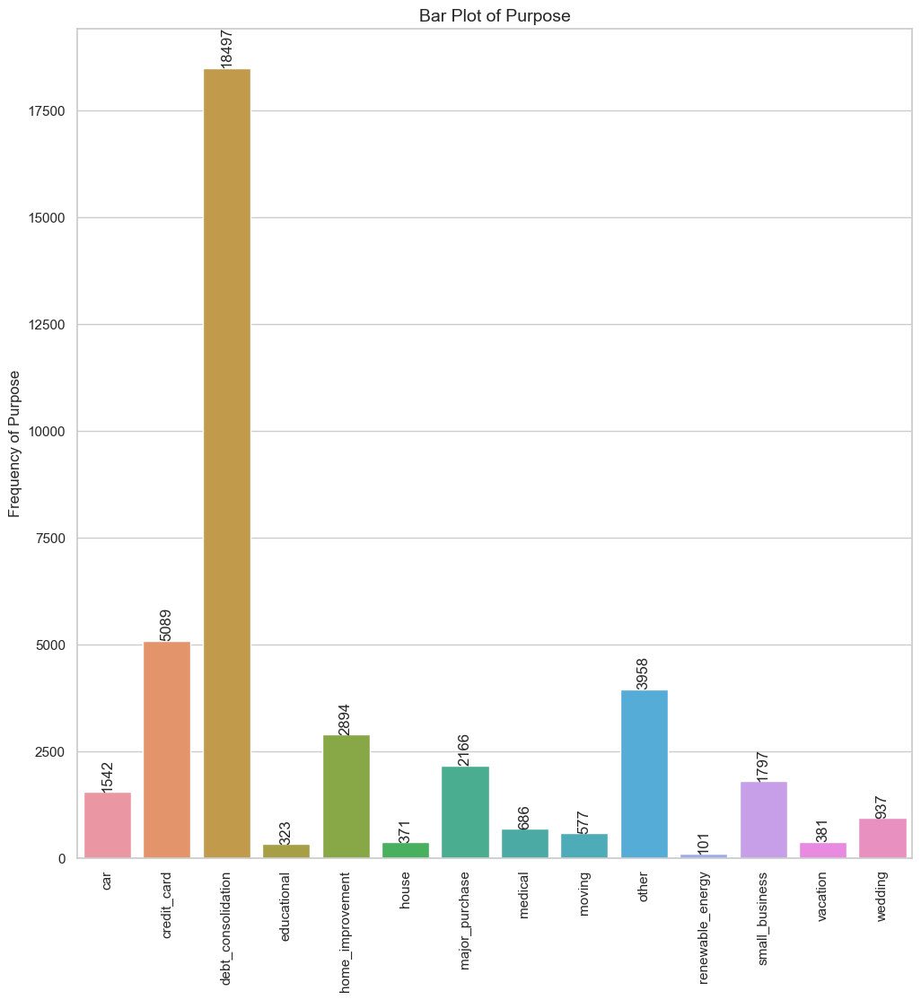

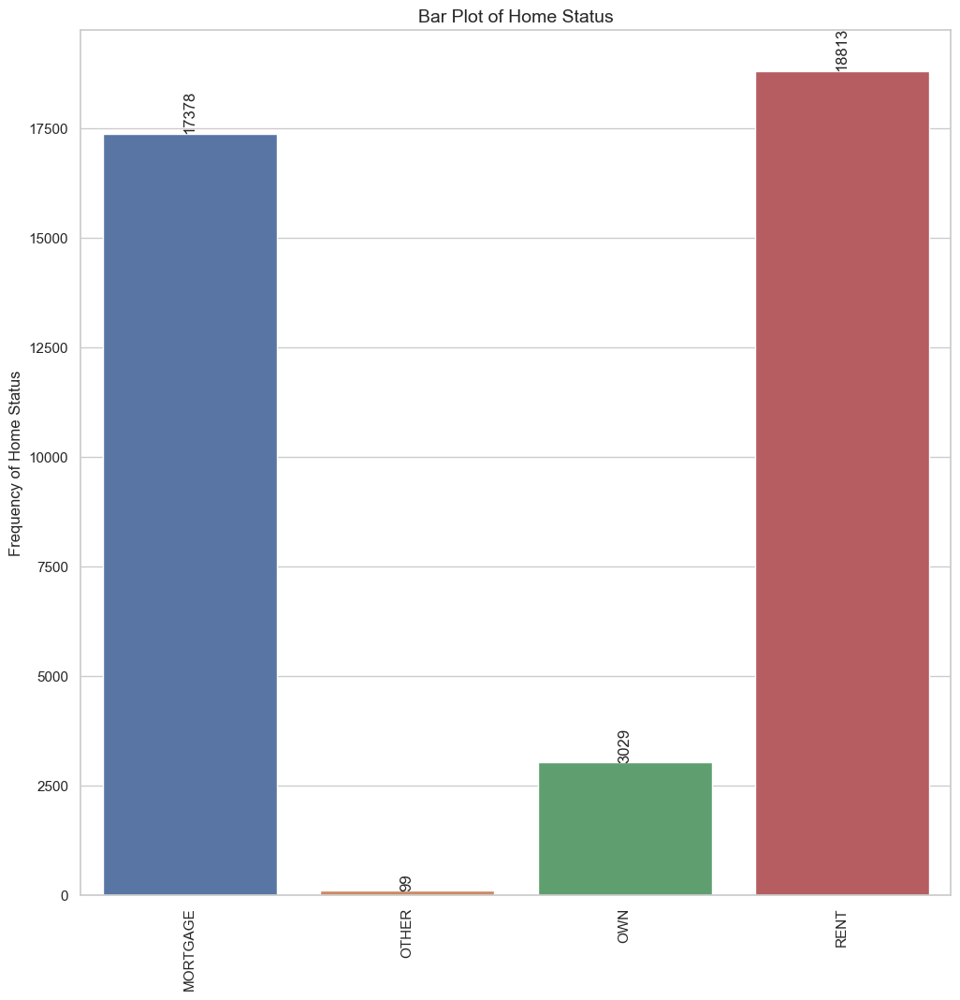

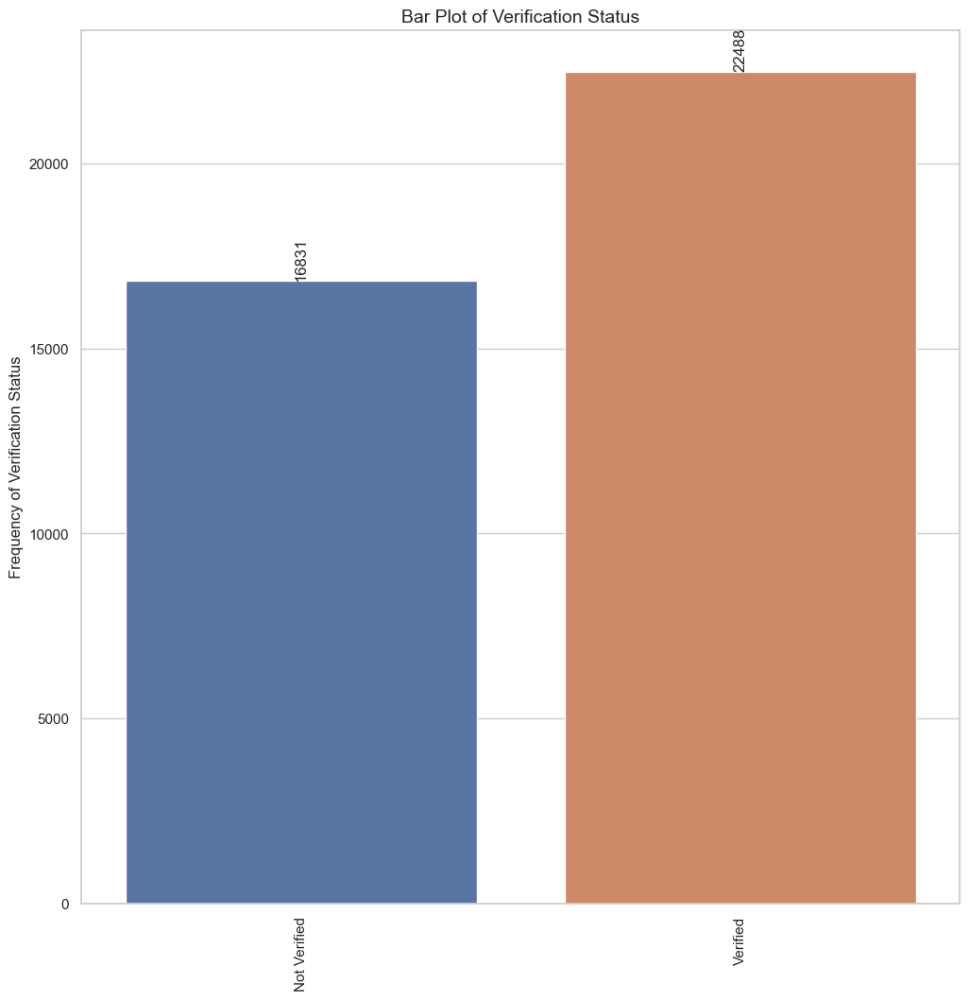

In [53]:
nonOrderedCat= [['loan_status','Loan Status'],['addr_state','State'],
            ['purpose','Purpose'],['home_ownership','Home Status'],['verification_status','Verification Status']
                                             ]


#Univariate Analysis unOrdered Category
for un_cat_var in nonOrderedCat:
    plot_bar_graph(
        lending_df,
        x_column = un_cat_var[0],
        y_column = un_cat_var[0],
        title = f'Bar Plot of {un_cat_var[1]}',
        xlabel = un_cat_var[1],
        ylabel=f'Frequency of {un_cat_var[1]}',
        figsize=(12, 12),
        x_tick_rotation=90,
        freq_rotation=90       
    )

#### Insights
#### Univariate Analysis  UnOrdered Category
- The number of defaulted loan is 6 times less than the number of fully paid loan. it is not Good indication.
- A large percentage of loans are taken for debt consolidation followed by credit card.
- Majority of the borrowers are from the  urban States like california, new york, texas, florida etc.
- Majority of borrowers don't possess property and are on mortgage or rent.
- Majority of the borrowers have no record of Public Recorded Bankruptcy.
- only 73% of the borrowers are verified by the company or have source verified.That is potential risk.


#### 3.1.3 Quantitative variables


In [54]:
Quantitative=[['term','Terms'],['loan_amnt','Loan Amount'],['int_rate','Interest Rate'],['annual_inc','Annual Income']
              ,['dti','Debt-to-Income'],['pub_rec_bankruptcies','Bankruptcies Record'],['installment','Installments'],
             ['inq_last_6mths','Credit Inquries'],['funded_amnt','Fund Allocated Amount'],['funded_amnt_inv','Disbursed Amount']]

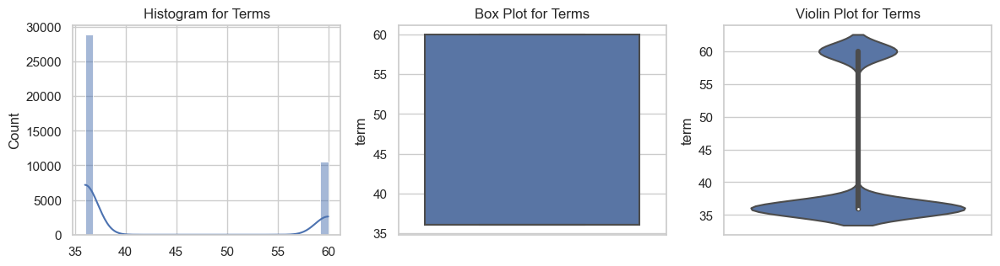

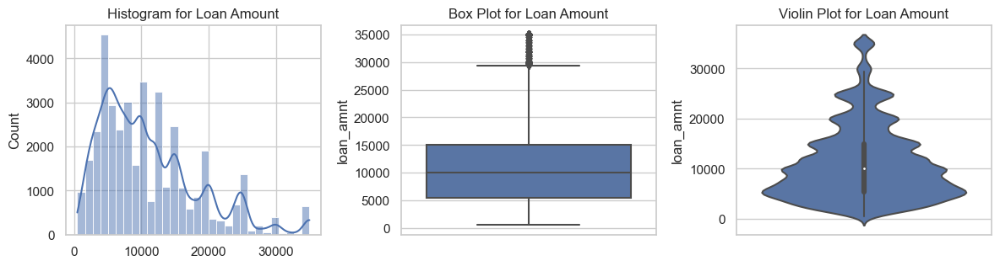

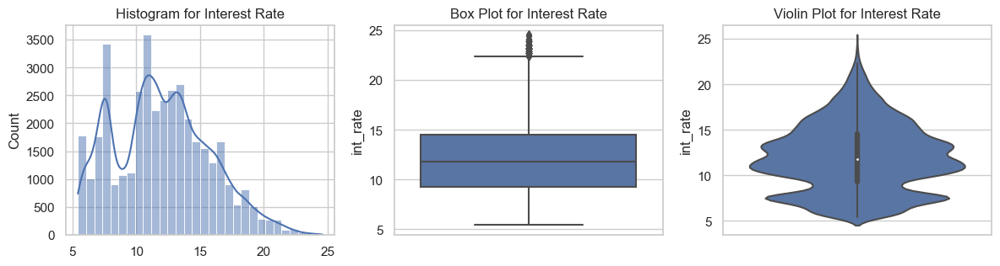

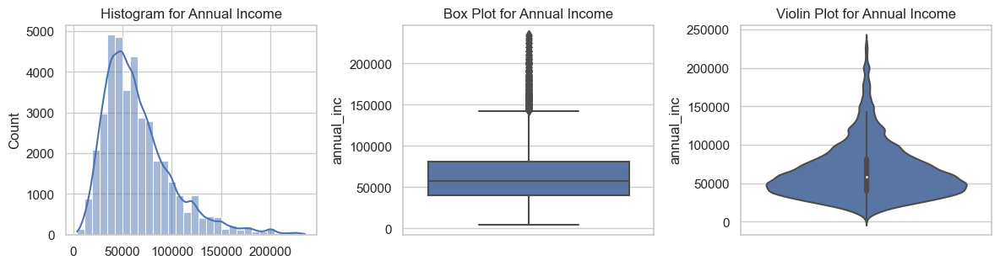

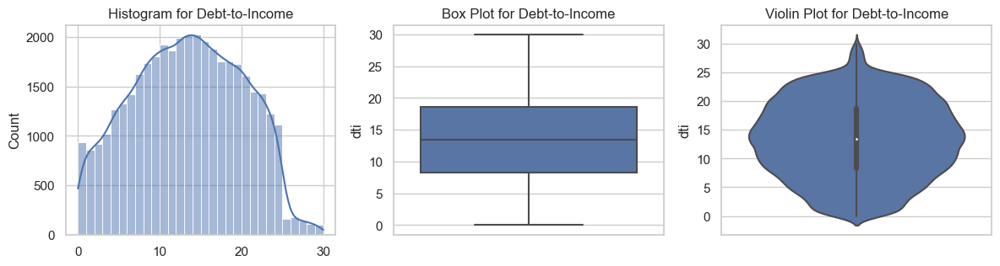

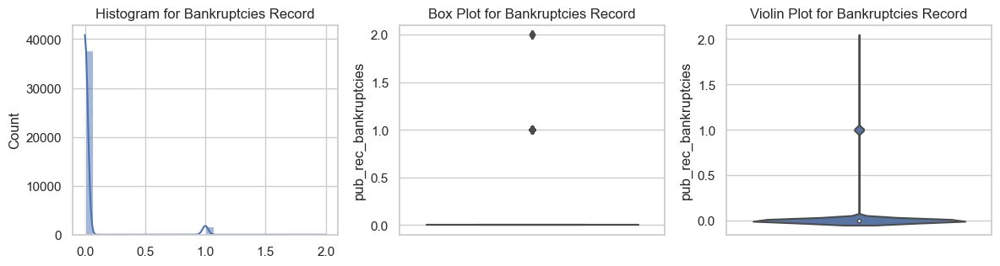

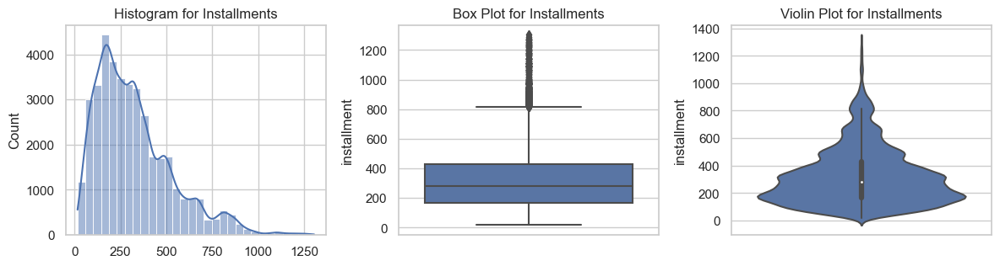

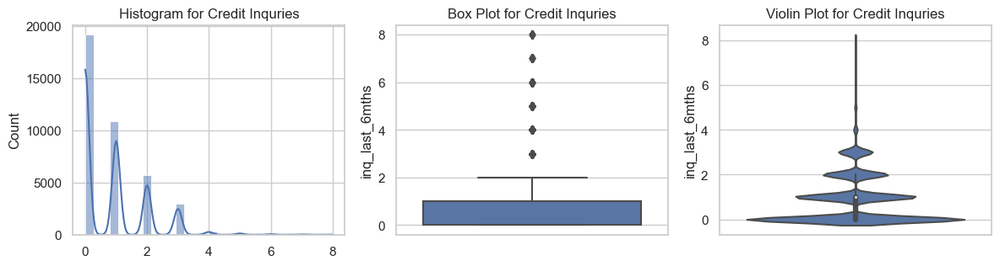

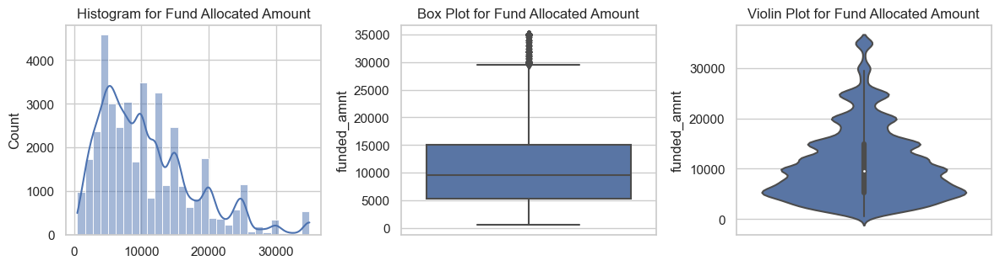

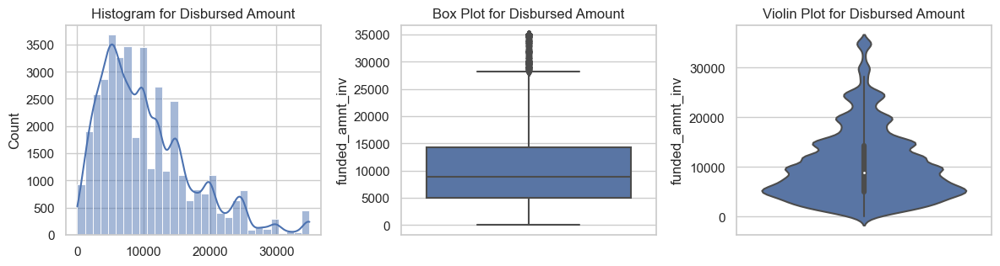

In [55]:
 
for quant_var in Quantitative:
    plot_Quantitativechart(lending_df,quant_var[0],quant_var[1])

#### Insights
#### Univariate Analysis Quantitaive

- The interest rate is more crowded around 5-10 and 10-15 with a drop near 10.
- Majority of the borrowers have very large debt compared to the income registerd, concentrated in the 10-15 DTI ratio.
- Majority of the borrowers has annual income around 50 K
-Loan Amount, Fund Amount and Disbursed amount follow the same pattern. so there is not much in the requested amount vs disbursed amount
- Number of credit inquiries in past 12 months(inq_last_12m), are less for most of the approved loans
- Most of the people have installment around 200
- Public Record bankruptcy is not there most of the data.
- The majority of loan has a term of 36 months compared to 60 months


#### 3.1.4 Segmented Univariate Analysis

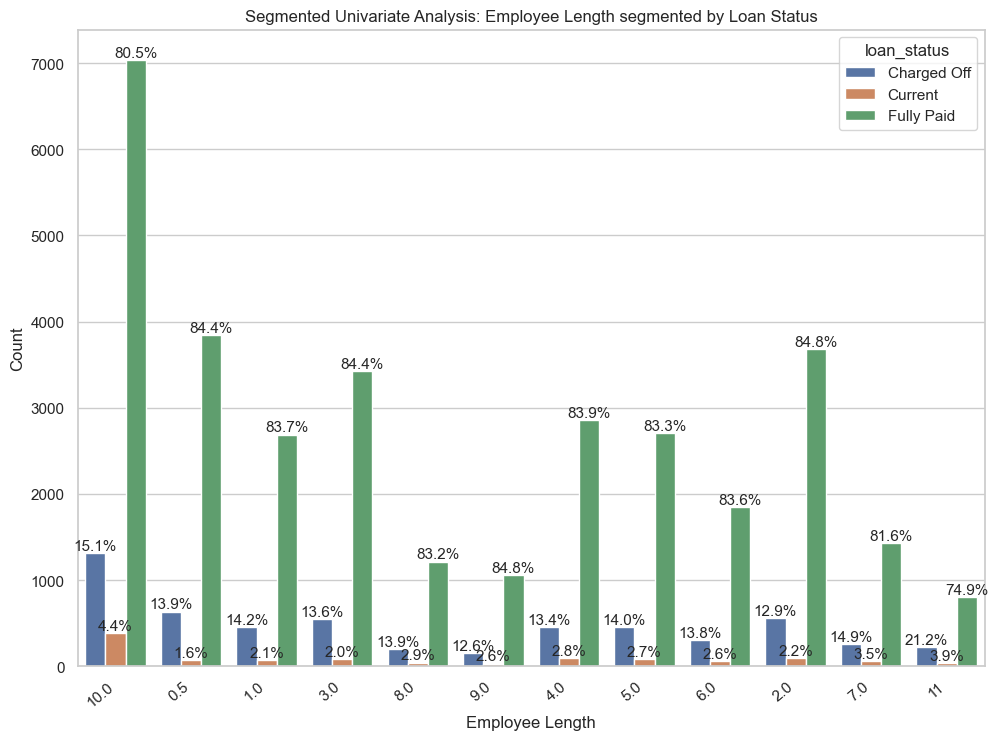

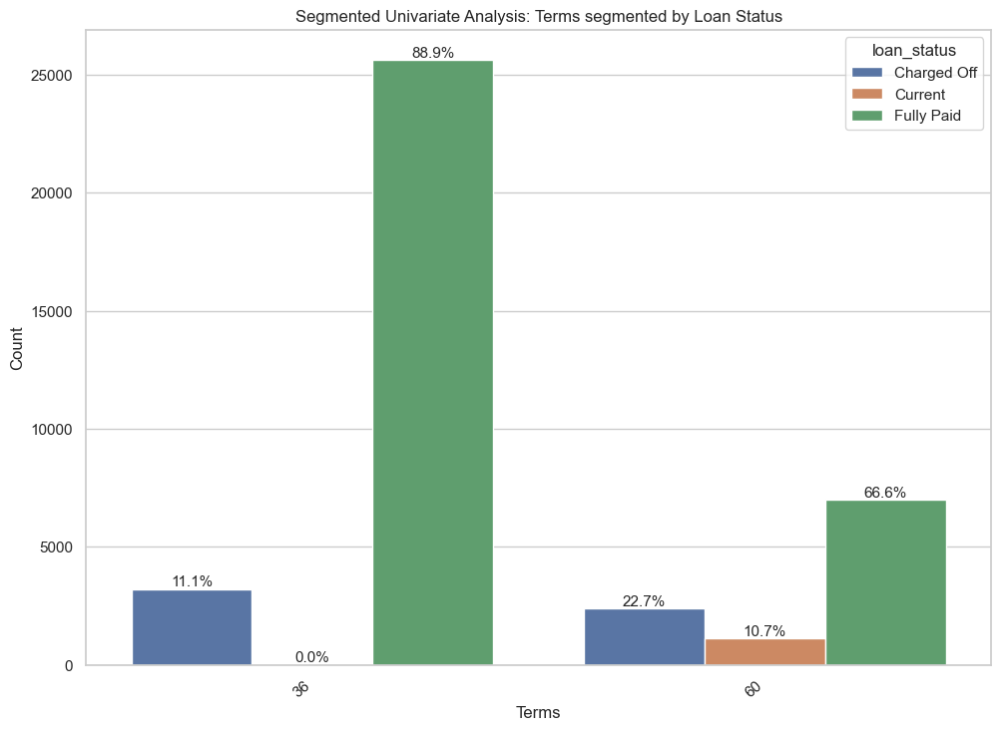

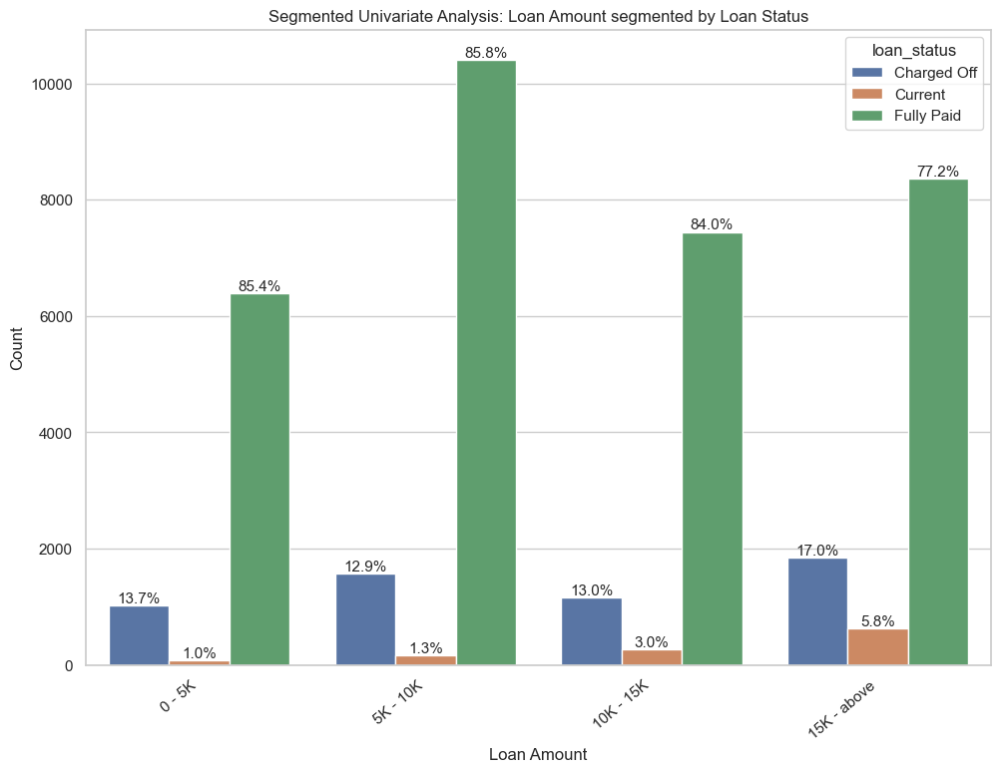

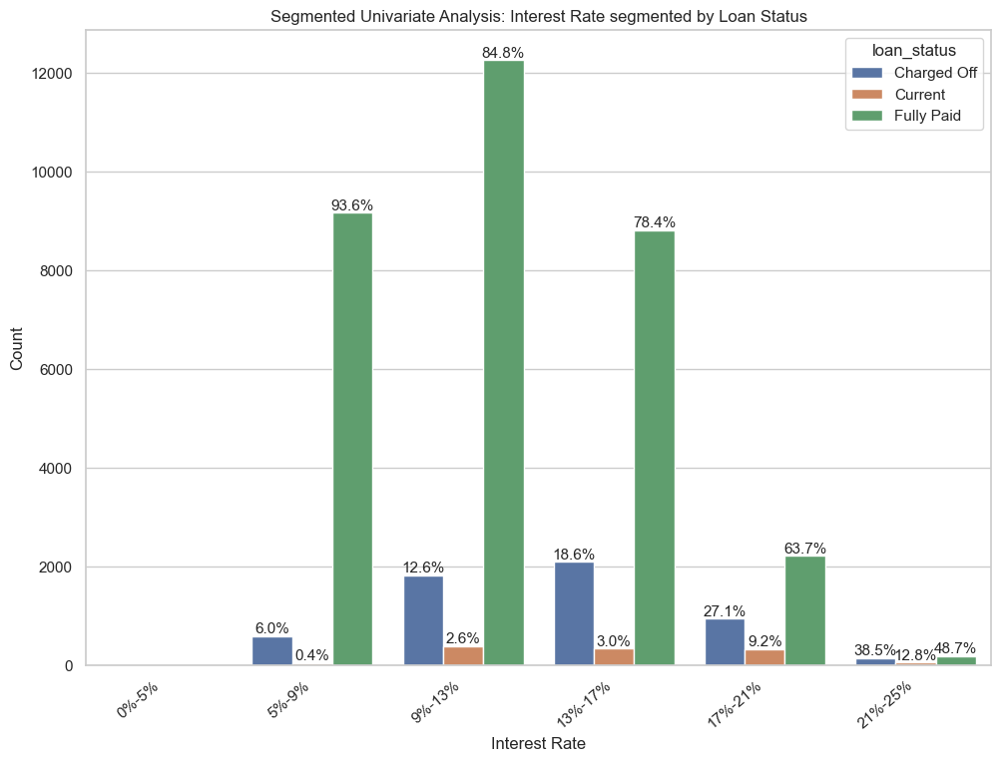

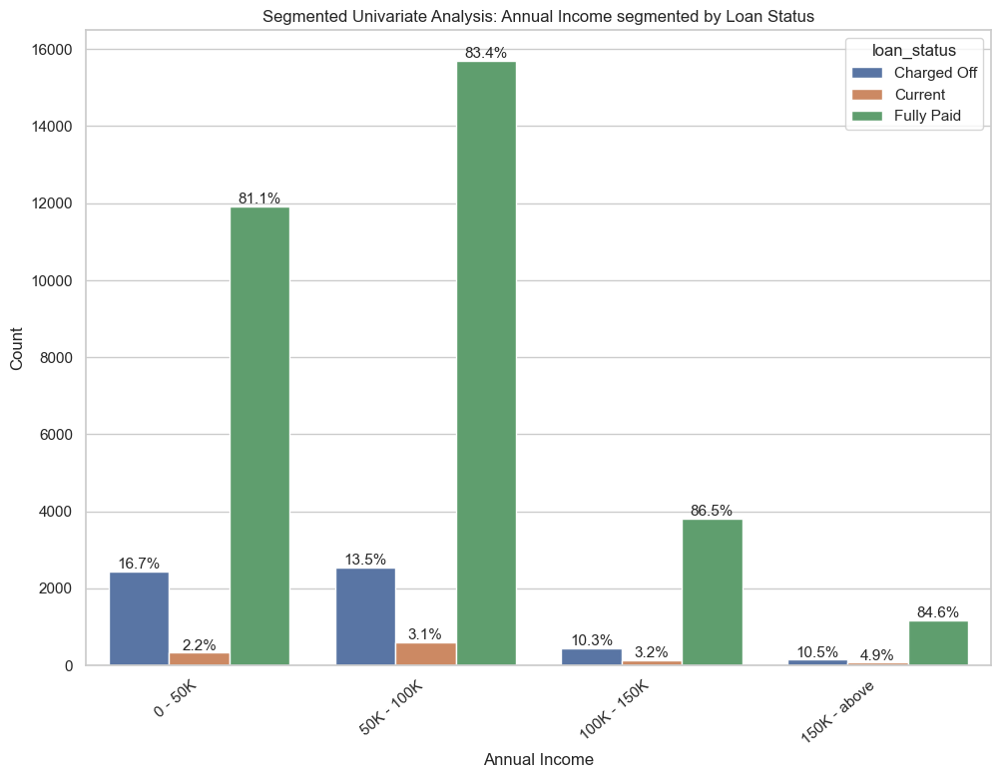

...

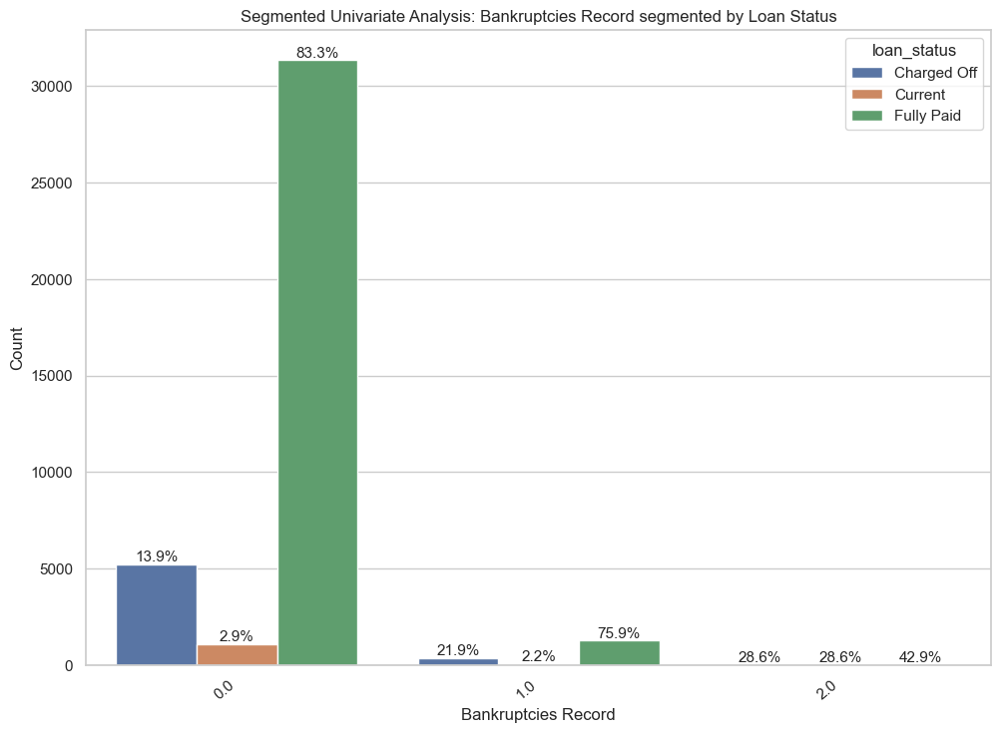

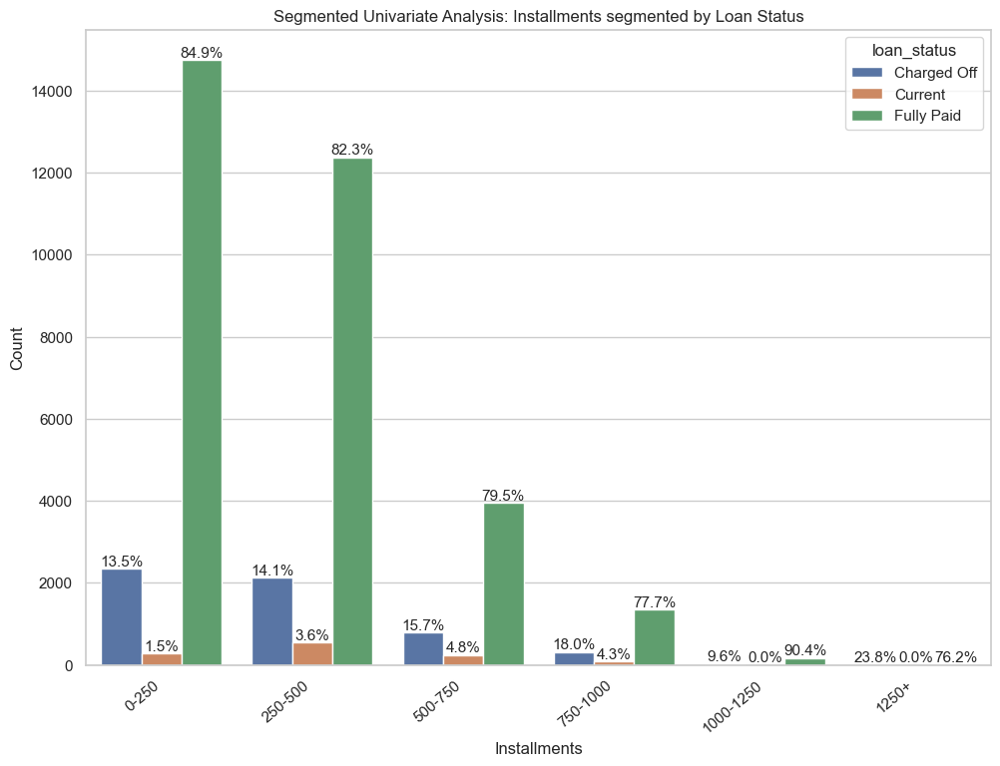

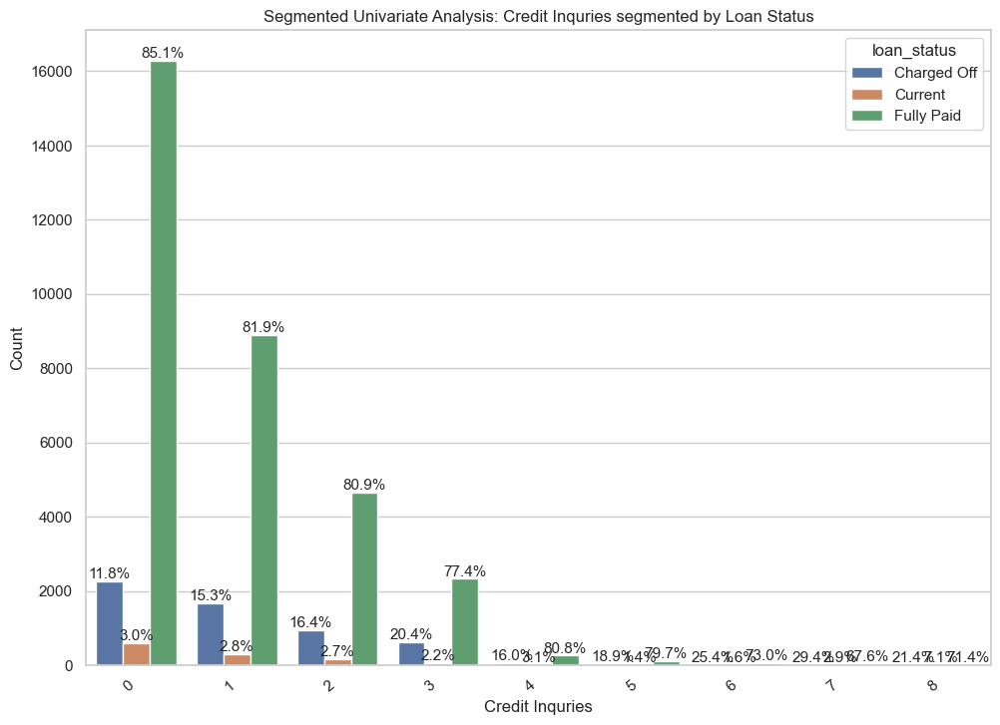

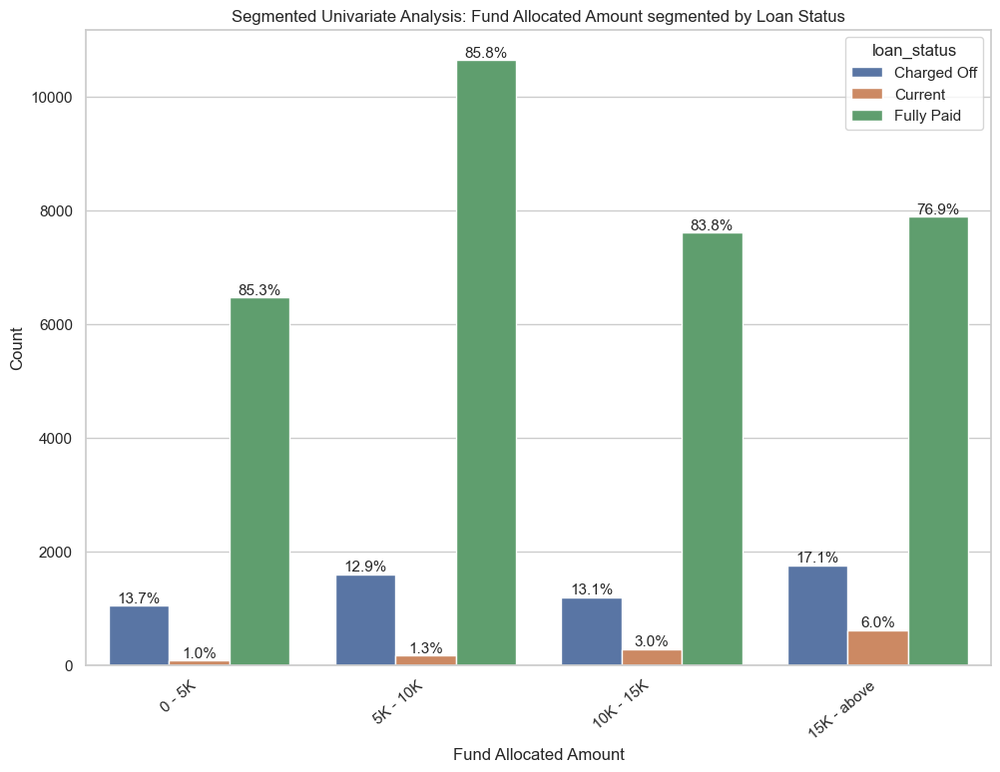

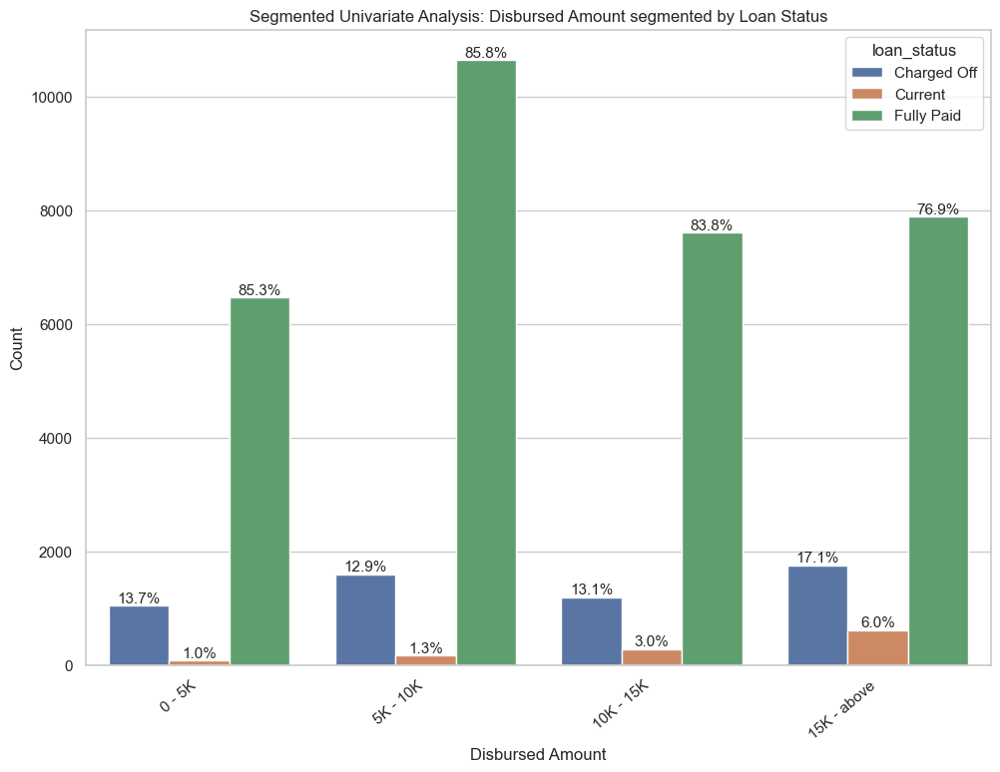

In [56]:
# Univariate analysis baed on Loan amount Segmented 
Datacolumns=[['emp_length','Employee Length'],['term','Terms'],['loan_amnt_bucket','Loan Amount'],['int_rate_bucket','Interest Rate'],['annual_inc_bucket','Annual Income']
              ,['dti_bucket','Debt-to-Income'],['pub_rec_bankruptcies','Bankruptcies Record'],['installment_bucket','Installments'],
             ['inq_last_6mths','Credit Inquries'],['funded_amnt_bucket','Fund Allocated Amount'],['funded_amnt_inv_bucket','Disbursed Amount']]
for col_var in Datacolumns:
    plot_SegmentedUnivariateforLoanStatus(lending_df,col_var[0],col_var[1],'loan_status','Loan Status')

#### Insights
#### Segmented Univariate Analysis
- Larger loans mean higher chance of defaulting.
- 60-month terms riskier, 36-month safer, with distinct grade distributions.
- Higher DTI has more default risk, especially in High and Very High Bucket.
- Fully paid loans surge over time; defaulted loans remain stable.
- Default risk higher for those renting; lower for property owners.
- Lower income (<15K) has higher default probability.
- Defaulted loan amounts rise when interest rates increases.
- Employees with 10+ years experience have higher changes to default .
- Bankruptcies Record increases  higher changes to default .
- Installments increases  higher changes to default .
- More number of credit inquiries  has  higher changes to default .


##  3.2.Bivariate Analysis

#### 3.2.1. Loan Grade vs. Interest Rate:


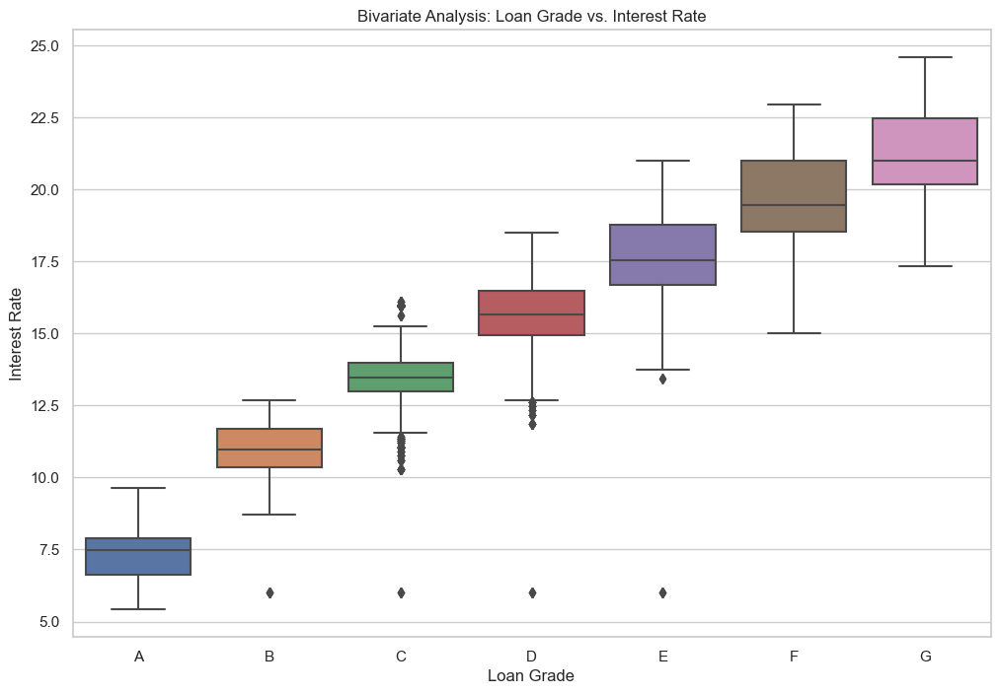

In [57]:
plt.figure(figsize=(12, 8))
sns.boxplot(x='grade', y='int_rate', data=lending_df)
plt.title('Bivariate Analysis: Loan Grade vs. Interest Rate')
plt.xlabel('Loan Grade')
plt.ylabel('Interest Rate')
plt.show()

#### 3.2.2. Loan Term vs. Loan Amount

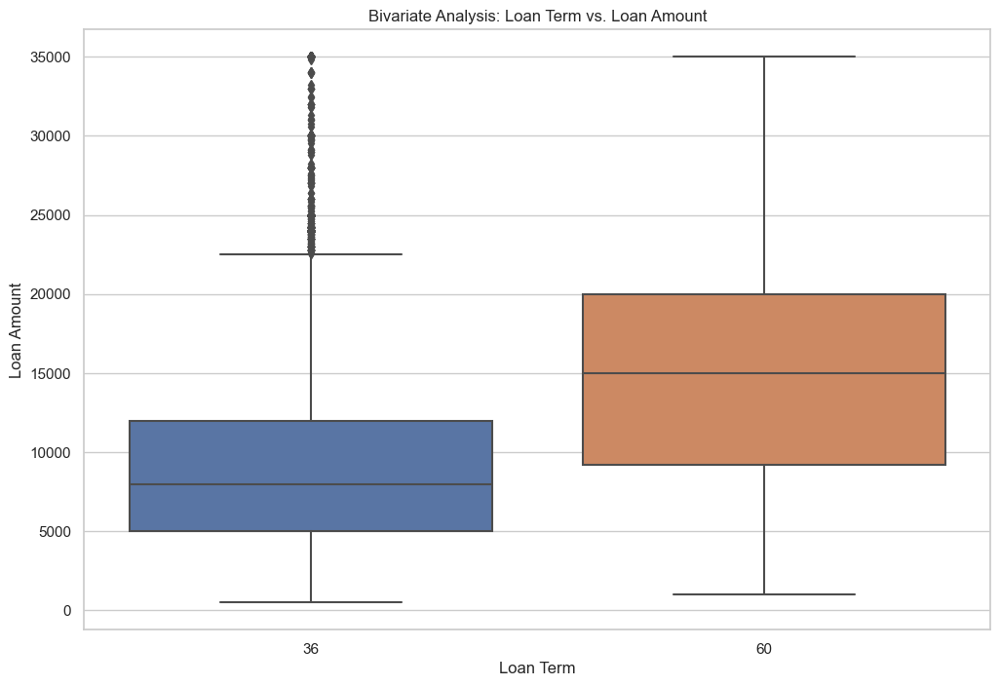

In [58]:
#Loan Term vs. Loan Amount
plt.figure(figsize=(12, 8))
sns.boxplot(x='term', y='loan_amnt', data=lending_df)
plt.title('Bivariate Analysis: Loan Term vs. Loan Amount')
plt.xlabel('Loan Term')
plt.ylabel('Loan Amount')
plt.show()

#### 3.2.3. Loan Status vs. Loan Amount

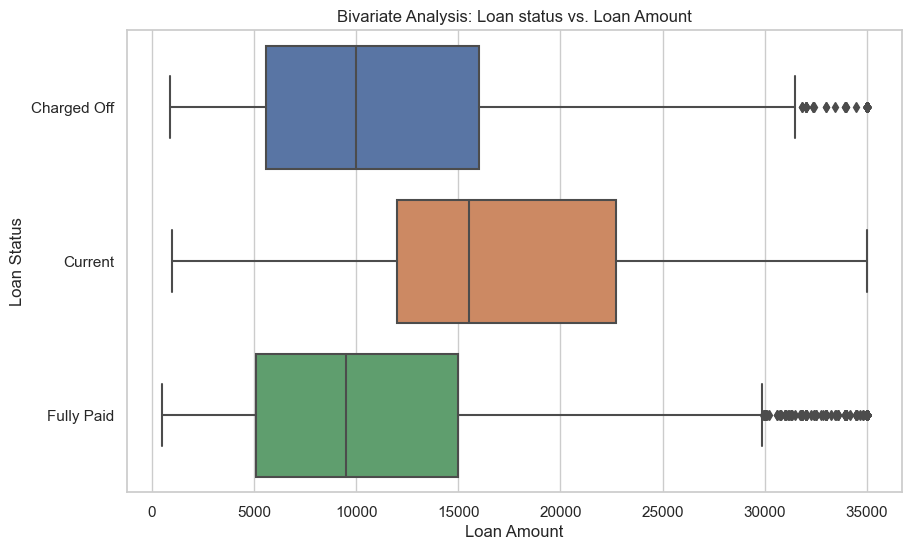

In [59]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='loan_amnt', y='loan_status', data=lending_df, orient="h")
plt.title('Bivariate Analysis: Loan status vs. Loan Amount')
plt.xlabel('Loan Amount')
plt.ylabel('Loan Status')

plt.show()

#### 3.2.4. Loan Status vs. DTI

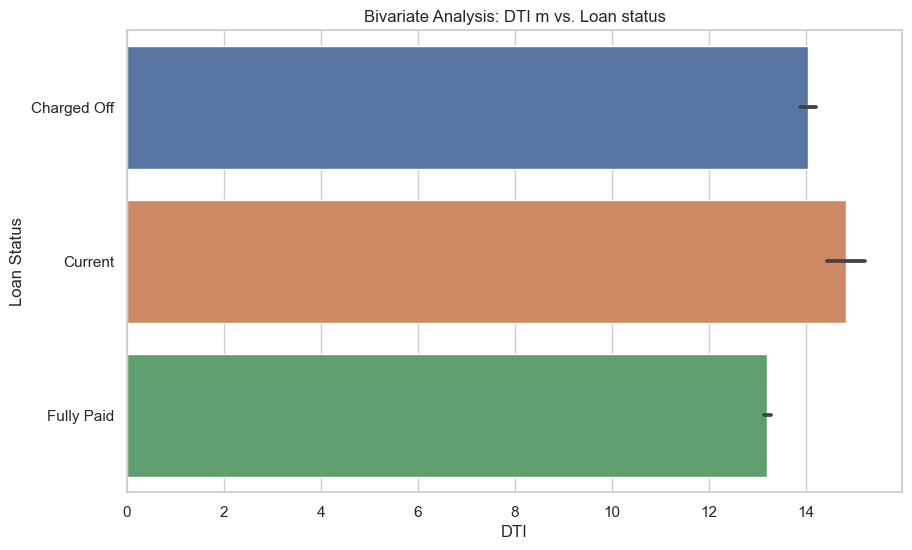

In [60]:
plt.figure(figsize=(10, 6))
sns.barplot(x='dti', y='loan_status', data=lending_df, orient="h")
plt.title('Bivariate Analysis: DTI m vs. Loan status')
plt.xlabel('DTI')
plt.ylabel('Loan Status')

plt.show()

#### 3.2.5. Loan Status vs. Annual income

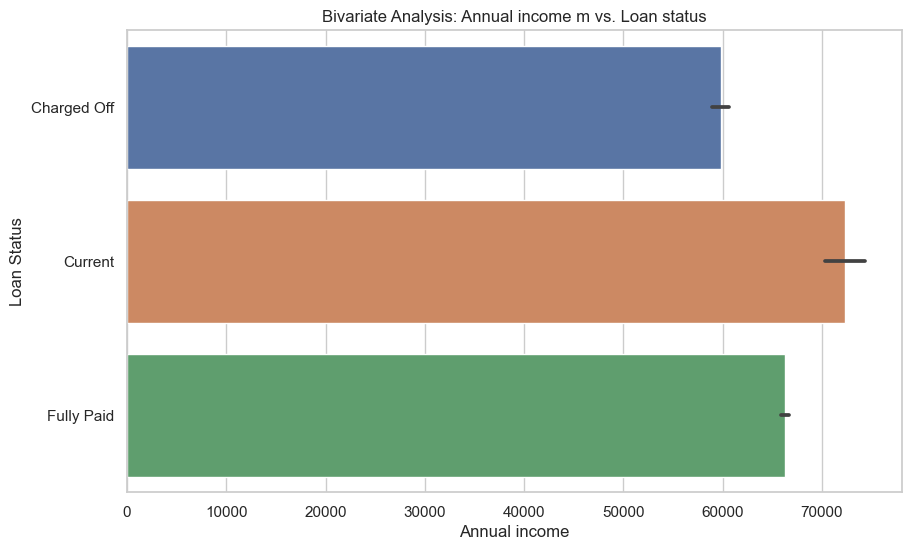

In [61]:
plt.figure(figsize=(10, 6))
sns.barplot(x='annual_inc', y='loan_status', data=lending_df, orient="h")
plt.title('Bivariate Analysis: Annual income m vs. Loan status')
plt.xlabel('Annual income')
plt.ylabel('Loan Status')

plt.show()

#### 3.2.6 Home Ownership vs. Loan Amount segmented by Loan Status:


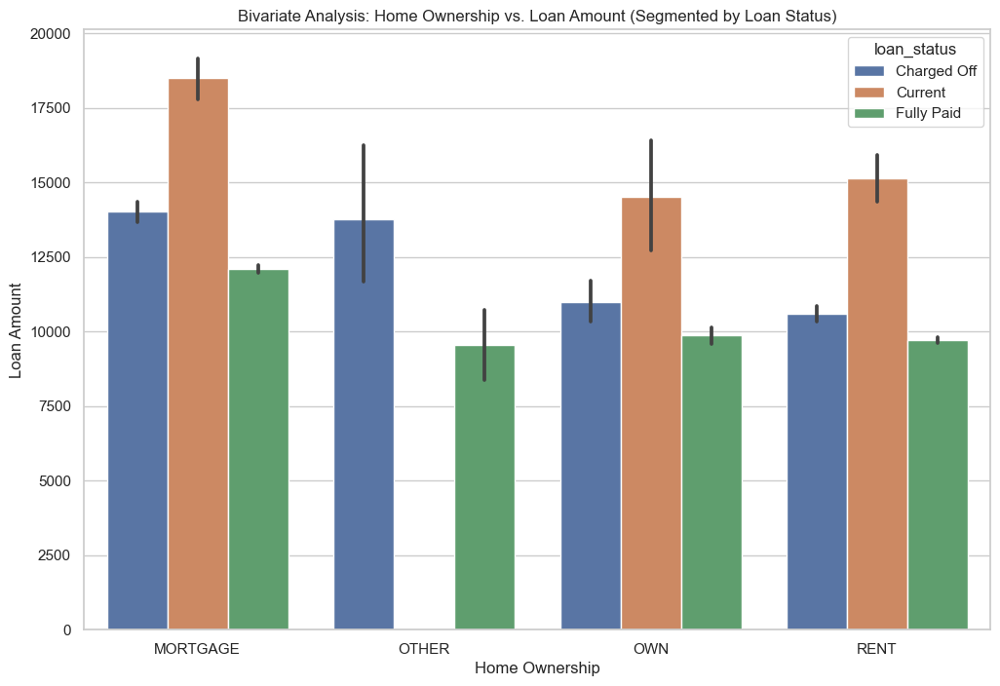

In [62]:
plt.figure(figsize=(12, 8))
sns.barplot(x='home_ownership', y='loan_amnt', hue='loan_status', data=lending_df)
plt.title('Bivariate Analysis: Home Ownership vs. Loan Amount (Segmented by Loan Status)')
plt.xlabel('Home Ownership')
plt.ylabel('Loan Amount')
plt.show()

#### Insights
- Borrowers living home in mortgage taking higher loan amount than others
- For all  home status, Loan amount increases, it becomes risky
- Lower DTI is less  risky than higher DTI
- Based this analysis, Current loan are more risky than usual.
- Loan amount mostly lesser than 15K
- Higher it grows, chances of default is higher.
- More number of borrowers in the 36 Months term
- 60 month term has more loan than 36 which is normal. As borrower get more amount and they more time to settle.
- Grade increase the Interest Rate increases 
- Higher the annual income ,reduces the risk of “Charged off”






## 4. Correlation Analysis

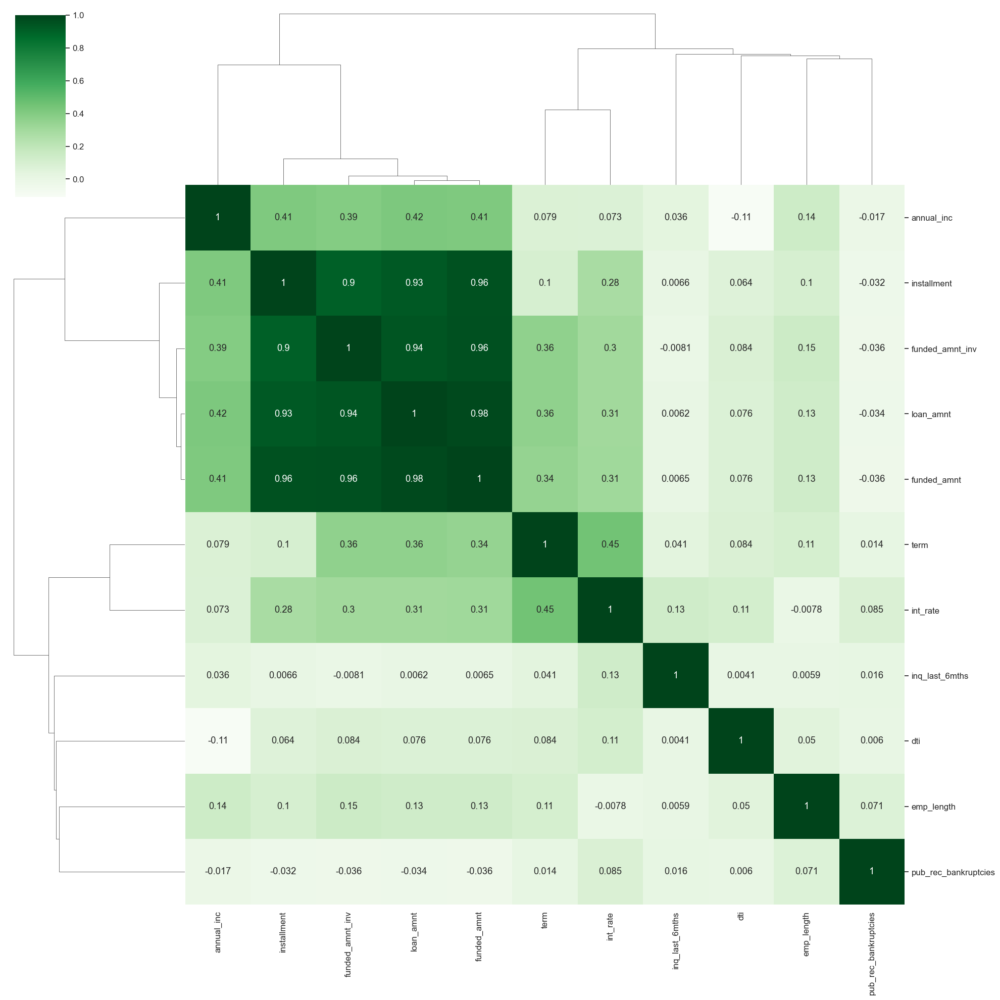

In [369]:
Quantitative=['emp_length','term','loan_amnt','int_rate','annual_inc','dti','pub_rec_bankruptcies','installment','inq_last_6mths','funded_amnt','funded_amnt_inv']

corr = lending_df[Quantitative].corr()
sns.set(font_scale=1.1)

sns.clustermap(corr, annot=True, figsize=(20,20), cmap="Greens")
plt.show()

#### Insights from Correlation Metrics for correlation data

- `installment` has a strong correlation with funded_amnt, loan_amnt, and funded_amnt_inv
- `term` has a strong correlation with interest rate
- `annual_inc` has a strong correlation with loan_amount

- `dti` has weak correlation with most of the fields
- `emp_length` has weak correlation with most of the fields. Employee Experience is not significant factor on load lending process.

- `pub_rec_bankrupticies` has a negative correlation with annual_inc, funded_amnt, loan_amnt, and funded_amnt_inv
- `annual_inc` has a negative correlation with dti
- `loan_amnt` has strong correlation with installment,funded_amnt, and funded_amnt_inv
